Part- 1

In [ ]:
!pip install torch torchvision opencv-python tqdm

In [ ]:
import torch
import cv2
import numpy as np
from tqdm import tqdm

In [ ]:
# paths
video_path = 'video1.mp4'
output_folder = 'output_frames/'
output_video_path = 'output_video1.mp4'

# pre-trained YOLOv5 model
model = torch.hub.load('ultralytics/yolov5', 'yolov5s', pretrained=True)

Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-9-30 Python-3.10.12 torch-2.4.1+cu121 CPU

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


In [ ]:
# Function to convert video to frames
def video_to_frames(video_path, output_folder):
    cap = cv2.VideoCapture(video_path)
    frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    frames = []
    for i in tqdm(range(frame_count)):
        ret, frame = cap.read()
        if ret:
            frames.append(frame)
        else:
            break
    cap.release()
    print(f"Total frames in the video: {frame_count}")
    return frames

In [ ]:
# Function for inference and drawing bounding boxes
def infer_on_frames(frames, model):
    processed_frames = []
    for frame in tqdm(frames, desc="Processing Frames"):
        # Convert BGR to RGB
        img_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        results = model(img_rgb)

        # Get the bounding boxes and labels
        for bbox in results.xyxy[0]:
            x1, y1, x2, y2, conf, cls = bbox
            # Check for car (2), truck (7), and bus (5)
            if int(cls) in [2, 5, 7]:  # 2: car, 5: bus, 7: truck
                cv2.rectangle(frame, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2)
                label = f"{model.names[int(cls)]} {conf:.2f}"
                cv2.putText(frame, label, (int(x1), int(y1) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

        processed_frames.append(frame)
    return processed_frames

In [ ]:
# Function for converting frames back to video
def frames_to_video(frames, output_path, fps=20):
    height, width, _ = frames[0].shape
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(output_path, fourcc, fps, (width, height))

    for frame in frames:
        out.write(frame)
    out.release()

frames = video_to_frames(video_path, output_folder) # converting video to frames
processed_frames = infer_on_frames(frames, model) # conducting inference
frames_to_video(processed_frames, output_video_path) #converting frames to video
print(f"Processed video saved at: {output_video_path}")

100%|██████████| 241/241 [00:06<00:00, 37.25it/s]


Total frames in the video: 241


Processing Frames:   0%|          | 0/241 [00:00<?, ?it/s]/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
Processing Frames:   0%|          | 1/241 [00:00<01:19,  3.03it/s]/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
Processing Frames:   1%|          | 2/241 [00:00<01:14,  3.21it/s]/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
Processing Frames:   1%|          | 3/241 [00:00<01:12,  3.29it/s]/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892

Processed video saved at: output_video1.mp4


In [ ]:
from google.colab import files
files.download(output_video_path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Part- 2

In [ ]:
!nvidia-smi

Mon Sep 30 10:57:29 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   60C    P8              11W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
# Pip install method (recommended)
!pip install ultralytics==8.0.196
from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics 8.3.0 🚀 Python-3.10.12 torch-2.4.1+cu121 CPU (Intel Xeon 2.20GHz)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 36.6/107.7 GB disk)


In [ ]:
from ultralytics import YOLO
from IPython.display import display, Image

In [ ]:
import zipfile
import os

# Extracting zip file
zip_file_path = '/content/aiHub.v1i.yolov8.zip'
extracted_folder_path = '/content/dataset'

# Extracting dataset
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extracted_folder_path)
os.listdir(extracted_folder_path)

['README.roboflow.txt',
 'train',
 'data.yaml',
 'valid',
 'README.dataset.txt',
 'test']

In [ ]:
!pip install -U albumentations ultralytics

  Using cached ultralytics-8.3.0-py3-none-any.whl.metadata (34 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 214.6/214.6 kB 8.8 MB/s eta 0:00:00
Using cached ultralytics-8.3.0-py3-none-any.whl (881 kB)
  Attempting uninstall: albucore
    Found existing installation: albucore 0.0.16
    Uninstalling albucore-0.0.16:
      Successfully uninstalled albucore-0.0.16
  Attempting uninstall: albumentations
    Found existing installation: albumentations 1.4.15
    Uninstalling albumentations-1.4.15:
      Successfully uninstalled albumentations-1.4.15
  Attempting uninstall: ultralytics
    Found existing installation: ultralytics 8.0.196
    Uninstalling ultralytics-8.0.196:
      Successfully uninstalled ultralytics-8.0.196


In [ ]:
from ultralytics import YOLO

# path to the YAML file of data
data_yaml_path = '/content/dataset/data.yaml'
# Loading pre-trained YOLOv8 model
model = YOLO("yolov8s.pt")

In [ ]:
# Training the model
results = model.train(data=data_yaml_path, epochs=25, imgsz=224)

Ultralytics 8.3.0 🚀 Python-3.10.12 torch-2.4.1+cu121 CPU (Intel Xeon 2.20GHz)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/dataset/data.yaml, epochs=25, time=None, patience=100, batch=16, imgsz=224, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=Tr

train: Scanning /content/train/labels.cache... 534 images, 0 backgrounds, 0 corrupt: 100%|██████████| 534/534 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/valid/labels.cache... 51 images, 0 backgrounds, 0 corrupt: 100%|██████████| 51/51 [00:00<?, ?it/s]


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001, momentum=0.9) with parameter groups 63 weight(decay=0.0), 70 weight(decay=0.0005), 69 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 224 train, 224 val
Using 0 dataloader workers
Logging results to runs/detect/train2
Starting training for 25 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/25         0G      1.128      3.642      1.256         30        224: 100%|██████████| 34/34 [02:37<00:00,  4.64s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.64s/it]

                   all         51         82     0.0119      0.855      0.319      0.241



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/25         0G      1.192      2.987       1.25         22        224: 100%|██████████| 34/34 [02:41<00:00,  4.75s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.02s/it]

                   all         51         82      0.679     0.0721      0.254      0.178



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/25         0G      1.306      2.454      1.315         26        224: 100%|██████████| 34/34 [02:47<00:00,  4.91s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.32s/it]

                   all         51         82      0.194      0.274      0.183      0.102



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/25         0G       1.27      2.177      1.262         23        224: 100%|██████████| 34/34 [02:31<00:00,  4.47s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.44s/it]

                   all         51         82      0.307      0.409      0.286      0.199



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/25         0G      1.217      2.045      1.292         19        224: 100%|██████████| 34/34 [02:32<00:00,  4.50s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.78s/it]

                   all         51         82      0.142      0.549      0.272      0.164



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/25         0G      1.169      1.888      1.251         16        224: 100%|██████████| 34/34 [02:33<00:00,  4.51s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.51s/it]

                   all         51         82      0.164      0.469      0.279      0.187



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/25         0G      1.098      1.832      1.237         22        224: 100%|██████████| 34/34 [02:30<00:00,  4.44s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.21s/it]

                   all         51         82      0.255      0.556      0.483      0.344



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/25         0G      1.132      1.766      1.238         17        224: 100%|██████████| 34/34 [02:31<00:00,  4.46s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.79s/it]

                   all         51         82      0.377      0.523      0.486      0.314



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/25         0G      1.067      1.714      1.219         20        224: 100%|██████████| 34/34 [02:34<00:00,  4.56s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.75s/it]

                   all         51         82      0.319      0.654      0.505      0.362



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/25         0G      1.029      1.609      1.184         22        224: 100%|██████████| 34/34 [02:33<00:00,  4.50s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.78s/it]

                   all         51         82      0.366      0.516      0.463      0.332



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/25         0G      1.057      1.582      1.196         37        224: 100%|██████████| 34/34 [02:34<00:00,  4.55s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.27s/it]

                   all         51         82      0.483      0.532      0.568      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/25         0G      1.004      1.511      1.169         21        224: 100%|██████████| 34/34 [02:34<00:00,  4.54s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.80s/it]

                   all         51         82       0.39      0.552      0.529      0.413



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/25         0G     0.9741      1.435      1.154         21        224: 100%|██████████| 34/34 [02:31<00:00,  4.46s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.15s/it]

                   all         51         82      0.452      0.682      0.596      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/25         0G     0.8956      1.387      1.128         21        224: 100%|██████████| 34/34 [02:32<00:00,  4.50s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.66s/it]

                   all         51         82      0.483      0.679      0.635      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/25         0G     0.9052      1.364      1.132         19        224: 100%|██████████| 34/34 [02:32<00:00,  4.49s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.29s/it]

                   all         51         82      0.535      0.575      0.638      0.485


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/25         0G      0.706       1.33      1.015          6        224: 100%|██████████| 34/34 [02:35<00:00,  4.57s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.75s/it]

                   all         51         82      0.441      0.606      0.542      0.408



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/25         0G      0.649      1.118     0.9986         10        224: 100%|██████████| 34/34 [02:32<00:00,  4.50s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.58s/it]

                   all         51         82      0.497      0.584       0.59      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/25         0G     0.6311      1.049     0.9842          7        224: 100%|██████████| 34/34 [02:33<00:00,  4.50s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.78s/it]

                   all         51         82      0.613      0.584      0.639      0.498



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/25         0G     0.6217     0.9871     0.9723         19        224: 100%|██████████| 34/34 [02:30<00:00,  4.43s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.30s/it]

                   all         51         82      0.529      0.797      0.692      0.532



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/25         0G     0.5934     0.9434      0.979          6        224: 100%|██████████| 34/34 [02:30<00:00,  4.43s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.76s/it]

                   all         51         82       0.56      0.598       0.66        0.5



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/25         0G     0.5756     0.8862     0.9744         11        224: 100%|██████████| 34/34 [02:31<00:00,  4.46s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.08s/it]

                   all         51         82      0.621       0.58      0.647      0.512



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/25         0G     0.5423     0.8141     0.9505          6        224: 100%|██████████| 34/34 [02:30<00:00,  4.42s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.33s/it]

                   all         51         82        0.6      0.564      0.626      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/25         0G     0.5266     0.8322     0.9541         15        224: 100%|██████████| 34/34 [02:29<00:00,  4.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.77s/it]

                   all         51         82      0.697      0.558      0.675      0.546



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/25         0G     0.5267     0.7844     0.9487          8        224: 100%|██████████| 34/34 [02:31<00:00,  4.46s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.48s/it]

                   all         51         82      0.673      0.624      0.707      0.578



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/25         0G     0.5028     0.7689      0.938          8        224: 100%|██████████| 34/34 [02:31<00:00,  4.46s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.74s/it]

                   all         51         82       0.65      0.644      0.695      0.571



25 epochs completed in 1.119 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 19.9MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 19.9MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics 8.3.0 🚀 Python-3.10.12 torch-2.4.1+cu121 CPU (Intel Xeon 2.20GHz)
Model summary (fused): 186 layers, 9,829,986 parameters, 0 gradients, 23.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.69s/it]


                   all         51         82      0.671      0.624      0.707      0.578
                Hammer          7         18      0.654      0.526      0.591      0.464
                Pliers          7          8      0.587       0.75      0.745      0.588
                  Rope         12         13      0.708      0.846      0.885      0.732
          Screw Driver          8         14      0.607      0.357      0.395      0.317
              Tool Box          6          7      0.682      0.857      0.944      0.808
                Wrench         12         22      0.788      0.409      0.683      0.556
Speed: 0.9ms preprocess, 135.0ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to runs/detect/train2


In [ ]:
model.val()

Ultralytics 8.3.0 🚀 Python-3.10.12 torch-2.4.1+cu121 CPU (Intel Xeon 2.20GHz)
Model summary (fused): 186 layers, 9,829,986 parameters, 0 gradients, 23.4 GFLOPs


val: Scanning /content/valid/labels.cache... 51 images, 0 backgrounds, 0 corrupt: 100%|██████████| 51/51 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:07<00:00,  1.94s/it]


                   all         51         82      0.671      0.624      0.707      0.578
                Hammer          7         18      0.654      0.526      0.591      0.464
                Pliers          7          8      0.587       0.75      0.745      0.588
                  Rope         12         13      0.708      0.846      0.885      0.732
          Screw Driver          8         14      0.607      0.357      0.395      0.317
              Tool Box          6          7      0.682      0.857      0.944      0.808
                Wrench         12         22      0.788      0.409      0.683      0.556
Speed: 0.9ms preprocess, 140.2ms inference, 0.0ms loss, 1.1ms postprocess per image
Results saved to runs/detect/train22


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x789b93d8b040>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
     

In [ ]:
from IPython.display import Image
# Path of results folder
results_path = 'runs/detect/train2/'

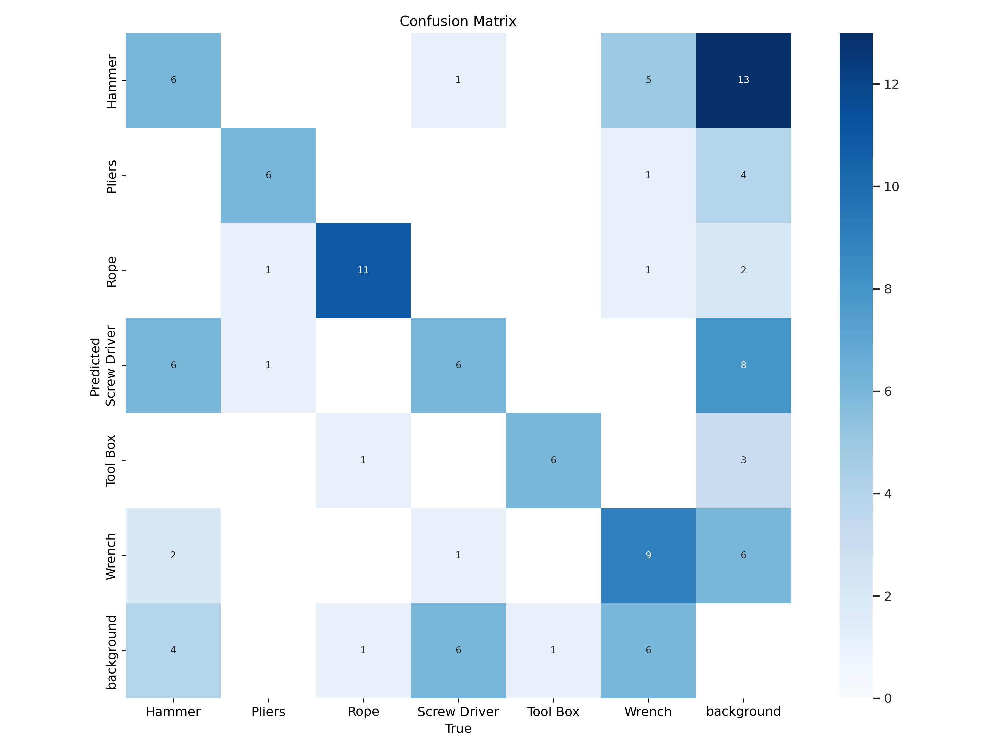

In [ ]:
# Displaying training confusion matrix
Image(filename=f'{results_path}confusion_matrix.png', width=600)

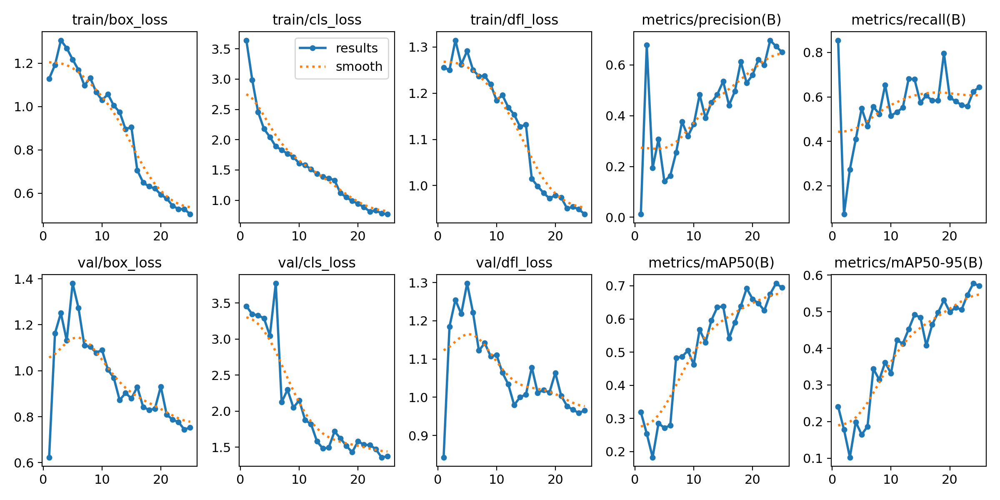

In [ ]:
Image(filename=f'{results_path}results.png', width=600)

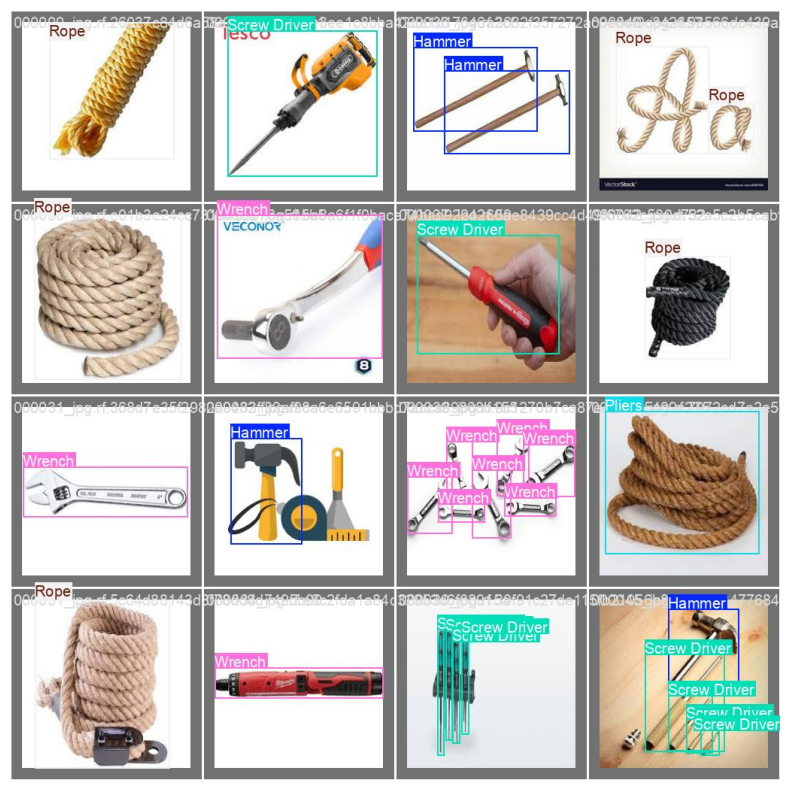

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Loading image
img_path = '/content/runs/detect/train2/val_batch0_labels.jpg'
img = mpimg.imread(img_path)

plt.figure(figsize=(10, 10))  # (width, height) of images
plt.imshow(img)
plt.axis('off')  # Hide axes
plt.show()

In [ ]:
model.predict(source="/content/test/images",save=True)


image 1/26 /content/test/images/000002_jpg.rf.3fe959f5175a87e988c5a5f69d779fcd.jpg: 224x224 1 Rope, 288.4ms
image 2/26 /content/test/images/000007_jpg.rf.4fea82fe27d57392d3bea4fee5d955f2.jpg: 224x224 1 Rope, 312.4ms
image 3/26 /content/test/images/000007_jpg.rf.60dbc245bf7d0b7c5455cf7333f99164.jpg: 224x224 3 Hammers, 2 Wrenchs, 184.2ms
image 4/26 /content/test/images/000008_jpg.rf.1c9fac7314f7c395684d767630d8435a.jpg: 224x224 1 Screw Driver, 530.4ms
image 5/26 /content/test/images/000008_jpg.rf.2ec3ae0f45aad59174c2139b1ab2c04c.jpg: 224x224 1 Hammer, 412.7ms
image 6/26 /content/test/images/000008_jpg.rf.92c9368abc042a5793ad34a08e16ccc7.jpg: 224x224 1 Tool Box, 373.6ms
image 7/26 /content/test/images/000013_jpg.rf.e379ee03d9b72a5439ae32dbb693de3a.jpg: 224x224 1 Rope, 288.5ms
image 8/26 /content/test/images/000016_jpg.rf.49caa35a4fa6c64f926aa19207624c03.jpg: 224x224 1 Hammer, 4 Plierss, 1 Wrench, 269.6ms
image 9/26 /content/test/images/000017_jpg.rf.dac6266dcf1b636cbbf68b83d5ef9e09.jpg: 

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'Hammer', 1: 'Pliers', 2: 'Rope', 3: 'Screw Driver', 4: 'Tool Box', 5: 'Wrench'}
 obb: None
 orig_img: array([[[173, 194, 216],
         [172, 193, 215],
         [185, 208, 230],
         ...,
         [255, 255, 255],
         [255, 255, 255],
         [255, 255, 255]],
 
        [[163, 184, 206],
         [163, 184, 206],
         [177, 200, 222],
         ...,
         [255, 255, 255],
         [255, 255, 255],
         [255, 255, 255]],
 
        [[150, 171, 193],
         [152, 173, 195],
         [166, 189, 211],
         ...,
         [255, 255, 255],
         [255, 255, 255],
         [255, 255, 255]],
 
        ...,
 
        [[255, 255, 255],
         [255, 255, 255],
         [255, 255, 255],
         ...,
         [189, 208, 221],
         [187, 206, 219],
         [186, 205, 218]],
 
        [[255, 255, 255],
         [255


image 1/1 /content/test/images/000023_jpg.rf.d8c03e61b1a685979e5068df93d85e1c.jpg: 224x224 1 Rope, 186.4ms
Speed: 1.5ms preprocess, 186.4ms inference, 1.5ms postprocess per image at shape (1, 3, 224, 224)


array([[[253, 253, 253],
        [253, 253, 253],
        [253, 253, 253],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [254, 254, 254]],

       [[253, 253, 253],
        [253, 253, 253],
        [253, 253, 253],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [254, 254, 254]],

       [[253, 253, 253],
        [253, 253, 253],
        [253, 253, 253],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [254, 254, 254]],

       ...,

       [[254, 254, 254],
        [254, 254, 254],
        [254, 254, 254],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [254, 254, 254]],

       [[254, 254, 254],
        [254, 254, 254],
        [254, 254, 254],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [254, 254, 254]],

       [[254, 254, 254],
        [254, 254, 254],
        [254, 254, 254],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [254, 254, 254]]], dtype=uint8)
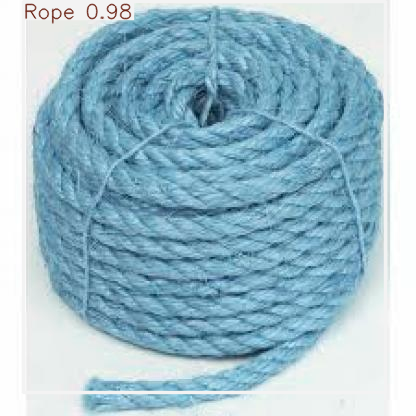

In [ ]:
import cv2
from ultralytics import YOLO
import matplotlib.pyplot as plt

# Loading image
img_path = '/content/test/images/000023_jpg.rf.d8c03e61b1a685979e5068df93d85e1c.jpg'
img = cv2.imread(img_path)
results = model.predict(source=img_path)
results[0].plot()


image 1/1 /content/test/images/000074_jpg.rf.05d94894535f90f7ef44cbbfa7314015.jpg: 224x224 1 Tool Box, 150.3ms
Speed: 1.5ms preprocess, 150.3ms inference, 1.8ms postprocess per image at shape (1, 3, 224, 224)


array([[[104,  31,  17],
        [104,  31,  17],
        [104,  31,  17],
        ...,
        [104,  31,  17],
        [104,  31,  17],
        [104,  31,  17]],

       [[104,  31,  17],
        [104,  31,  17],
        [104,  31,  17],
        ...,
        [104,  31,  17],
        [104,  31,  17],
        [104,  31,  17]],

       [[110,  39,  27],
        [127,  66,  55],
        [138,  82,  71],
        ...,
        [104,  31,  17],
        [104,  31,  17],
        [104,  31,  17]],

       ...,

       [[104,  31,  17],
        [104,  31,  17],
        [196, 167, 162],
        ...,
        [104,  31,  17],
        [104,  31,  17],
        [104,  31,  17]],

       [[104,  31,  17],
        [104,  31,  17],
        [104,  31,  17],
        ...,
        [104,  31,  17],
        [104,  31,  17],
        [104,  31,  17]],

       [[104,  31,  17],
        [104,  31,  17],
        [104,  31,  17],
        ...,
        [104,  31,  17],
        [104,  31,  17],
        [104,  31,  17]]], dtype=uint8)
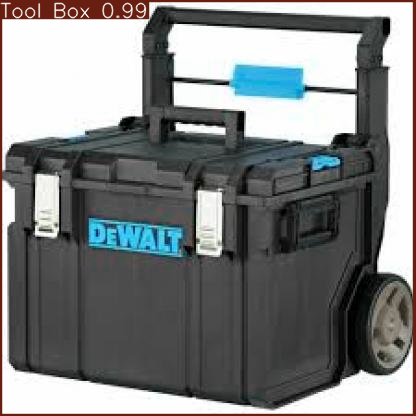

In [ ]:
import cv2
from ultralytics import YOLO
import matplotlib.pyplot as plt

# Loading image
img_path = '/content/test/images/000074_jpg.rf.05d94894535f90f7ef44cbbfa7314015.jpg'
img = cv2.imread(img_path)
results = model.predict(source=img_path)
results[0].plot()


image 1/1 /content/test/images/000008_jpg.rf.2ec3ae0f45aad59174c2139b1ab2c04c.jpg: 224x224 1 Hammer, 229.5ms
Speed: 1.6ms preprocess, 229.5ms inference, 1.5ms postprocess per image at shape (1, 3, 224, 224)


array([[[252, 252, 252],
        [252, 252, 252],
        [252, 252, 252],
        ...,
        [253, 253, 253],
        [253, 253, 253],
        [253, 253, 253]],

       [[252, 252, 252],
        [252, 252, 252],
        [252, 252, 252],
        ...,
        [253, 253, 253],
        [253, 253, 253],
        [253, 253, 253]],

       [[252, 252, 252],
        [252, 252, 252],
        [252, 252, 252],
        ...,
        [253, 253, 253],
        [253, 253, 253],
        [253, 253, 253]],

       ...,

       [[253, 253, 253],
        [253, 253, 253],
        [253, 253, 253],
        ...,
        [253, 253, 253],
        [253, 253, 253],
        [253, 253, 253]],

       [[253, 253, 253],
        [253, 253, 253],
        [253, 253, 253],
        ...,
        [253, 253, 253],
        [253, 253, 253],
        [253, 253, 253]],

       [[253, 253, 253],
        [253, 253, 253],
        [253, 253, 253],
        ...,
        [253, 253, 253],
        [253, 253, 253],
        [253, 253, 253]]], dtype=uint8)
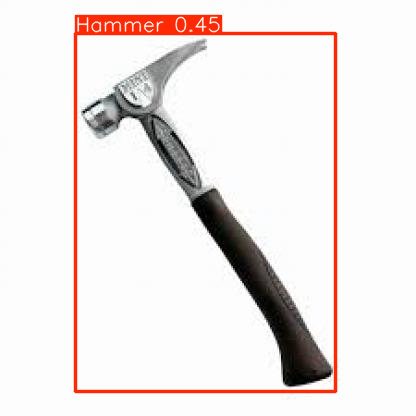

In [ ]:
import cv2
from ultralytics import YOLO
import matplotlib.pyplot as plt

# Loading image
img_path = '/content/test/images/000008_jpg.rf.2ec3ae0f45aad59174c2139b1ab2c04c.jpg'
img = cv2.imread(img_path)
results = model.predict(source=img_path)
results[0].plot()

Using Detectron2

In [1]:
!pip install pyyaml==5.1

import torch
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 kB 3.4 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
torch:  2.4 ; cuda:  cu121
  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-ugmtqtnw
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-ugmtqtnw
  Resolved https://github.com/facebookresearch/detectron2.git to commit ebe8b45437f86395352ab13402ba45b75b4d1ddb
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━

In [1]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# importing common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [2]:
!curl -L "https://universe.roboflow.com/ds/h96nCQUSXH?key=8FjhUVSW6W" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   901  100   901    0     0   2030      0 --:--:-- --:--:-- --:--:--  2029
100 9069k  100 9069k    0     0  2504k      0  0:00:03  0:00:03 --:--:-- 4592k
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
   creating: test/
 extracting: test/000002_jpg.rf.3fe959f5175a87e988c5a5f69d779fcd.jpg  
 extracting: test/000007_jpg.rf.4fea82fe27d57392d3bea4fee5d955f2.jpg  
 extracting: test/000007_jpg.rf.60dbc245bf7d0b7c5455cf7333f99164.jpg  
 extracting: test/000008_jpg.rf.1c9fac7314f7c395684d767630d8435a.jpg  
 extracting: test/000008_jpg.rf.2ec3ae0f45aad59174c2139b1ab2c04c.jpg  
 extracting: test/000008_jpg.rf.92c9368abc042a5793ad34a08e16ccc7.jpg  
 extracting: test/000013_jpg.rf.e379ee03d9b72a5439ae32dbb693de3a.jpg  
 extracting: test/000016_jpg.rf.49caa35a4fa6c64f926aa19207624c03.jpg 

In [3]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, "/content/train/_annotations.coco.json", "/content/train")
register_coco_instances("my_dataset_test", {}, "/content/test/_annotations.coco.json", "/content/test")

WARNING [09/30 11:25:04 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[09/30 11:25:04 d2.data.datasets.coco]: Loaded 534 images in COCO format from /content/train/_annotations.coco.json


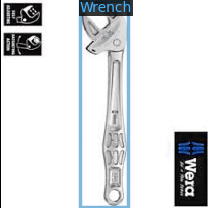

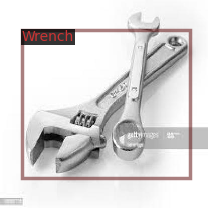

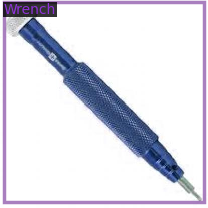

In [4]:
import random
from detectron2.utils.visualizer import Visualizer
#visualizing training data
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dict = DatasetCatalog.get("my_dataset_train")

for d in random.sample(dataset_dict, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

In [5]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")  # initializing training from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.0025
cfg.SOLVER.MAX_ITER = 500
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 6

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=True)
trainer.train()

[09/30 11:25:06 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_280758.pkl: 167MB [00:02, 81.5MB/s]                          
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[09/30 11:25:08 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.10/dist-packages/torch/functional.py:513: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3609.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[09/30 11:25:18 d2.utils.events]:  eta: 0:02:19  iter: 19  total_loss: 2.266  loss_cls: 1.687  loss_box_reg: 0.4775  loss_rpn_cls: 0.004897  loss_rpn_loc: 0.0124    time: 0.2975  last_time: 0.3142  data_time: 0.0187  last_data_time: 0.0055   lr: 9.7405e-05  max_mem: 1737M
[09/30 11:25:27 d2.utils.events]:  eta: 0:02:13  iter: 39  total_loss: 1.112  loss_cls: 0.5463  loss_box_reg: 0.4983  loss_rpn_cls: 0.01211  loss_rpn_loc: 0.01889    time: 0.3008  last_time: 0.2633  data_time: 0.0106  last_data_time: 0.0198   lr: 0.00019731  max_mem: 1737M
[09/30 11:25:33 d2.utils.events]:  eta: 0:02:08  iter: 59  total_loss: 0.9277  loss_cls: 0.4012  loss_box_reg: 0.5081  loss_rpn_cls: 0.002833  loss_rpn_loc: 0.009325    time: 0.2993  last_time: 0.2924  data_time: 0.0081  last_data_time: 0.0053   lr: 0.0002972  max_mem: 1737M
[09/30 11:25:39 d2.utils.events]:  eta: 0:02:02  iter: 79  total_loss: 0.665  loss_cls: 0.2659  loss_box_reg: 0.3893  loss_rpn_cls: 0.001941  loss_rpn_loc: 0.007808    time: 0.2

In [6]:
# training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [7]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # testing threshold
cfg.DATASETS.TEST = ("my_dataset_test", )
predictor = DefaultPredictor(cfg)

[09/30 11:27:56 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


/usr/local/lib/python3.10/dist-packages/fvcore/common/checkpoint.py:252: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(f, map_location=torch.device("cpu"))

In [8]:
test_metadata = MetadataCatalog.get("my_dataset_test")

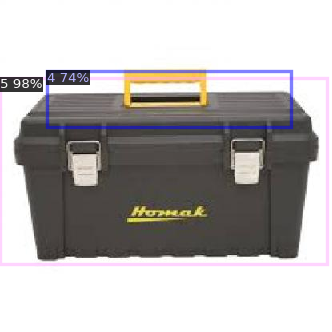

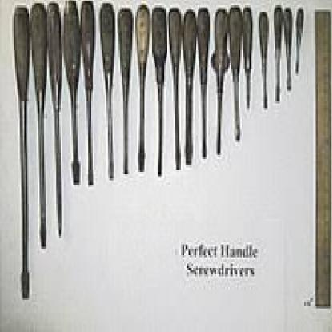

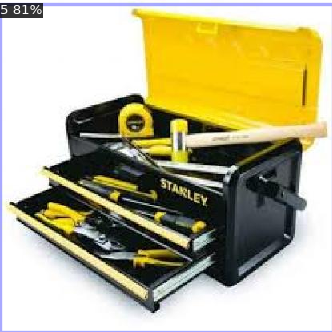

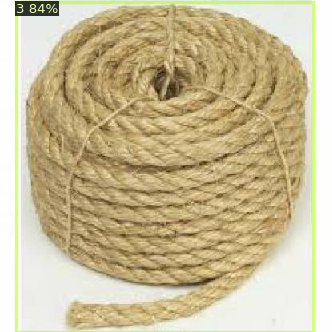

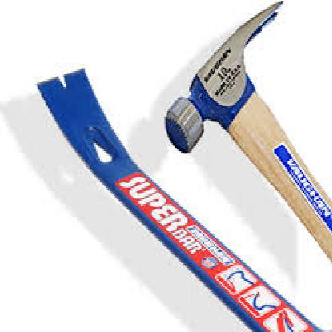

...

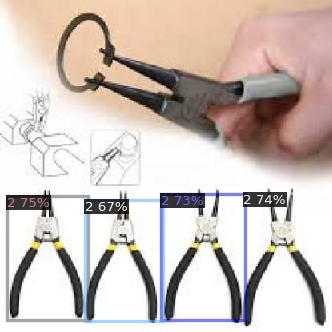

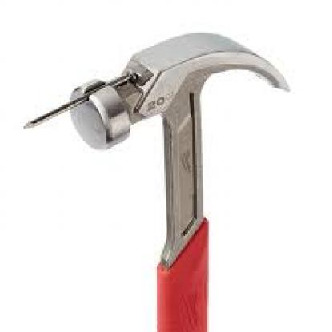

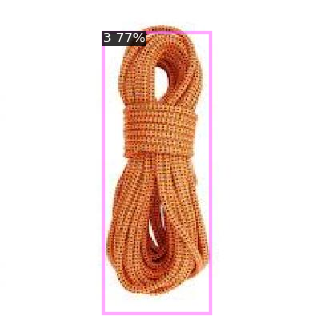

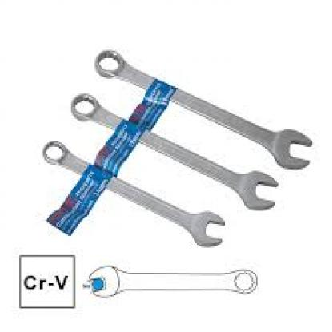

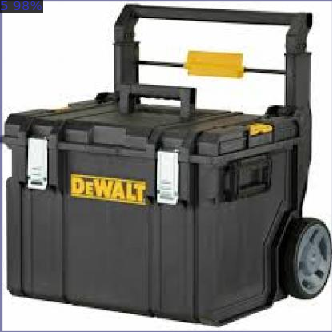

In [9]:
from detectron2.utils.visualizer import ColorMode
import glob

for imageName in glob.glob('/content/test/*jpg'):
  im = cv2.imread(imageName)
  outputs = predictor(im)
  v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata,
                scale=0.8
                 )
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])